# Predicting Buying Session - Modeling

## Init

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
%matplotlib inline
import seaborn as sns

In [2]:
from sklearn.preprocessing import OneHotEncoder, LabelEncoder

from sklearn.preprocessing import RobustScaler, StandardScaler

from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import BernoulliNB
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

from sklearn.metrics import confusion_matrix, classification_report

from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

C:\Users\gabri\anaconda3\lib\site-packages\sklearn\externals\six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


In [3]:
df = pd.read_csv('online_shoppers_intention.csv')

In [4]:
num_feats = ['Administrative', 'Administrative_Duration', 'Informational', 
             'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration', 
             'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay']

In [5]:
obj_feats = ['Month', 'OperatingSystems', 'Browser', 'Region',
             'TrafficType', 'VisitorType']
df[obj_feats] = df[obj_feats].astype('object')

cat_feats = ['Month', 'OperatingSystems', 'Browser', 'Region',
             'TrafficType', 'VisitorType', 'Weekend']

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  object 
 12  Browser                  12330 non-null  object 
 13  Region                   12330 non-null  object 
 14  TrafficType           

In [7]:
df = df[['Revenue', 'Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay', 'Month',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'VisitorType',
       'Weekend']]

In [8]:
df.columns

Index(['Revenue', 'Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay', 'Month',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'VisitorType',
       'Weekend'],
      dtype='object')

## Preprocessing

In [9]:
onehot = OneHotEncoder()
for feat in ['Month', 'OperatingSystems', 'Browser', 'Region',
             'TrafficType', 'VisitorType']:
    onehotvalue = onehot.fit_transform(df[feat].values.reshape(-1,1)).toarray()
    onehotcols = pd.DataFrame(onehotvalue, columns = [
        feat + '_' + str(onehot.categories_[0][i])
        for i in range(len(onehot.categories_[0]))
    ])
    df = pd.concat([df, onehotcols], axis = 1)
    print(f'{feat} encoded')
    df = df.drop(columns=feat)

Month encoded
OperatingSystems encoded
Browser encoded
Region encoded
TrafficType encoded
VisitorType encoded


In [10]:
label_encoder = LabelEncoder()
for column in ['Weekend', 'Revenue']:
    df[column] = label_encoder.fit_transform(df[column])
    print({index: label for index, label in enumerate(label_encoder.classes_)})
    print(f'{column} encoded')

{0: False, 1: True}
Weekend encoded
{0: False, 1: True}
Revenue encoded


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 75 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Revenue                        12330 non-null  int32  
 1   Administrative                 12330 non-null  int64  
 2   Administrative_Duration        12330 non-null  float64
 3   Informational                  12330 non-null  int64  
 4   Informational_Duration         12330 non-null  float64
 5   ProductRelated                 12330 non-null  int64  
 6   ProductRelated_Duration        12330 non-null  float64
 7   BounceRates                    12330 non-null  float64
 8   ExitRates                      12330 non-null  float64
 9   PageValues                     12330 non-null  float64
 10  SpecialDay                     12330 non-null  float64
 11  Weekend                        12330 non-null  int32  
 12  Month_Aug                      12330 non-null 

## Unscaled Data

### Split Train/Test 80/20

In [12]:
X = df.iloc[:,1:]
y = df['Revenue']

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.20,
                                                    random_state = 88)

for data in [x_train, x_test, y_train, y_test]:
    print(data.shape)

(9864, 74)
(2466, 74)
(9864,)
(2466,)


### Spot Check Classification Algorithms

#### LogReg

Train score: 88.35%
Test score: 88.08%

              precision    recall  f1-score   support

           0       0.89      0.97      0.93      2073
           1       0.74      0.39      0.51       393

    accuracy                           0.88      2466
   macro avg       0.82      0.68      0.72      2466
weighted avg       0.87      0.88      0.87      2466



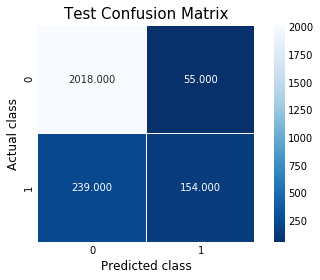

In [13]:
# LOGISTIC REGRESSION
classifier = LogisticRegression(solver='newton-cg',
                                penalty='l2',
                                max_iter=100
                               )
classifier.fit(x_train, y_train)
y_pred = classifier.predict(x_test)

# METRICS
print(f'Train score: {round(classifier.score(x_train, y_train)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test, y_test)*100, 2)}%\n')

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

#### DT

Train score: 100.0%
Test score: 86.66%

              precision    recall  f1-score   support

           0       0.92      0.92      0.92      2073
           1       0.58      0.59      0.58       393

    accuracy                           0.87      2466
   macro avg       0.75      0.75      0.75      2466
weighted avg       0.87      0.87      0.87      2466



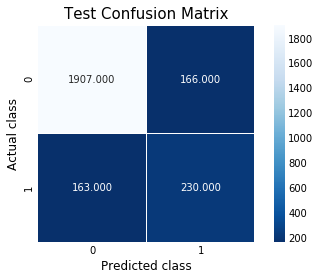

In [14]:
# DECISION TREE
classifier = DecisionTreeClassifier(criterion='gini', 
                                    max_depth=None, 
                                    min_samples_split=2,
                                    min_samples_leaf=1
                                   )
classifier.fit(x_train, y_train)
y_pred = classifier.predict(x_test)

# METRICS
print(f'Train score: {round(classifier.score(x_train, y_train)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test, y_test)*100, 2)}%\n')

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

In [15]:
# VISUALIZE TREE
dot_data = StringIO()
export_graphviz(classifier, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = x_train.columns, class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('DT Purchase.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.764602 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.764602 to fit



#### RF

Train score: 100.0%
Test score: 90.51%

              precision    recall  f1-score   support

           0       0.92      0.97      0.95      2073
           1       0.80      0.54      0.65       393

    accuracy                           0.91      2466
   macro avg       0.86      0.76      0.80      2466
weighted avg       0.90      0.91      0.90      2466



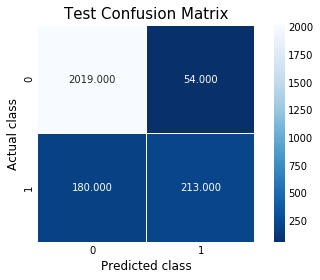

In [16]:
# RANDOM FOREST
classifier = RandomForestClassifier(criterion='gini', 
                                    max_depth=None, 
                                    min_samples_split=2, 
                                    min_samples_leaf=1, 
                                    n_estimators=100
                                   )
classifier.fit(x_train, y_train)
y_pred = classifier.predict(x_test)

# METRICS
print(f'Train score: {round(classifier.score(x_train, y_train)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test, y_test)*100, 2)}%\n')

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

#### KNN

Train score: 89.42%
Test score: 86.62%

              precision    recall  f1-score   support

           0       0.88      0.97      0.92      2073
           1       0.66      0.34      0.44       393

    accuracy                           0.87      2466
   macro avg       0.77      0.65      0.68      2466
weighted avg       0.85      0.87      0.85      2466



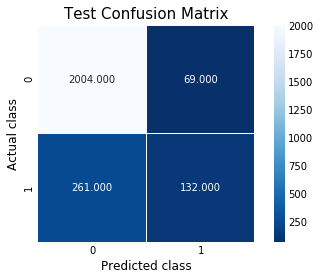

In [17]:
# K NEAREST NEIGHBORS
classifier = KNeighborsClassifier(n_neighbors=5,
                                  algorithm='auto'
                                 )
classifier.fit(x_train, y_train)
y_pred = classifier.predict(x_test)

# METRICS
print(f'Train score: {round(classifier.score(x_train, y_train)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test, y_test)*100, 2)}%\n')

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

#### Naive Bayes

Train score: 85.07%
Test score: 85.89%

              precision    recall  f1-score   support

           0       0.93      0.90      0.91      2073
           1       0.55      0.64      0.59       393

    accuracy                           0.86      2466
   macro avg       0.74      0.77      0.75      2466
weighted avg       0.87      0.86      0.86      2466



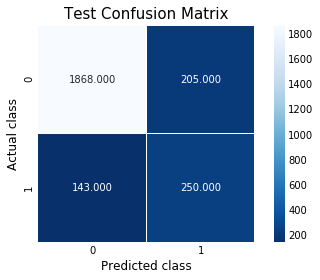

In [18]:
# NAIVE BAYES
classifier = BernoulliNB(alpha=1.0
                       )
classifier.fit(x_train, y_train)
y_pred = classifier.predict(x_test)

# METRICS
print(f'Train score: {round(classifier.score(x_train, y_train)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test, y_test)*100, 2)}%\n')

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

#### SVM

Train score: 88.51%
Test score: 88.85%

              precision    recall  f1-score   support

           0       0.89      0.98      0.94      2073
           1       0.82      0.39      0.53       393

    accuracy                           0.89      2466
   macro avg       0.86      0.69      0.73      2466
weighted avg       0.88      0.89      0.87      2466



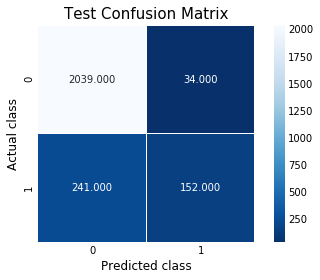

In [19]:
# SUPPORT VECTOR MACHINES
classifier = SVC(kernel='linear')
classifier.fit(x_train, y_train)
y_pred = classifier.predict(x_test)

# METRICS
print(f'Train score: {round(classifier.score(x_train, y_train)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test, y_test)*100, 2)}%\n')

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

C:\Users\gabri\anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


Train score: 98.65%
Test score: 84.14%

              precision    recall  f1-score   support

           0       0.84      1.00      0.91      2073
           1       0.60      0.02      0.03       393

    accuracy                           0.84      2466
   macro avg       0.72      0.51      0.47      2466
weighted avg       0.80      0.84      0.77      2466



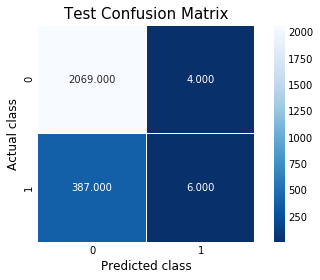

In [20]:
# SUPPORT VECTOR MACHINES
classifier = SVC(kernel='rbf')
classifier.fit(x_train, y_train)
y_pred = classifier.predict(x_test)

# METRICS
print(f'Train score: {round(classifier.score(x_train, y_train)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test, y_test)*100, 2)}%\n')

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

#### MLP

Train score: 86.07%
Test score: 85.81%

              precision    recall  f1-score   support

           0       0.86      1.00      0.92      2073
           1       0.96      0.11      0.20       393

    accuracy                           0.86      2466
   macro avg       0.91      0.56      0.56      2466
weighted avg       0.87      0.86      0.81      2466



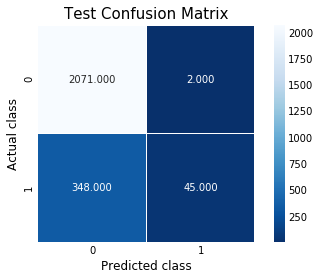

In [21]:
# MLP
classifier = MLPClassifier(hidden_layer_sizes=(100,),
                           activation='relu',
                           solver='adam', 
                           alpha=0.0001, 
                           random_state=1
                          )
classifier.fit(x_train, y_train)
y_pred = classifier.predict(x_test)

# METRICS
print(f'Train score: {round(classifier.score(x_train, y_train)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test, y_test)*100, 2)}%\n')

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

Train score: 59.44%
Test score: 60.58%

              precision    recall  f1-score   support

           0       0.87      0.63      0.73      2073
           1       0.20      0.50      0.29       393

    accuracy                           0.61      2466
   macro avg       0.53      0.56      0.51      2466
weighted avg       0.76      0.61      0.66      2466



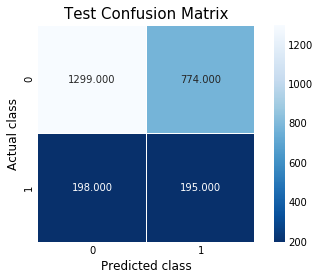

In [22]:
# MLP
classifier = MLPClassifier(hidden_layer_sizes=(100,),
                           activation='relu',
                           solver='lbfgs', 
                           alpha=0.0001, 
                           random_state=1
                          )
classifier.fit(x_train, y_train)
y_pred = classifier.predict(x_test)

# METRICS
print(f'Train score: {round(classifier.score(x_train, y_train)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test, y_test)*100, 2)}%\n')

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

## RobustScaler

In [23]:
robust = RobustScaler()
df_robust = pd.DataFrame(robust.fit_transform(df[num_feats]), columns=num_feats)
df_robust = pd.concat([df_robust, df.drop(columns=num_feats)], axis=1)
df_robust.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,...,TrafficType_14,TrafficType_15,TrafficType_16,TrafficType_17,TrafficType_18,TrafficType_19,TrafficType_20,VisitorType_New_Visitor,VisitorType_Other,VisitorType_Returning_Visitor
count,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,1.233000e+04,12330.000000,1.233000e+04,12330.000000,12330.000000,...,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000
mean,0.328792,0.786206,0.503569,34.472398,0.442951,4.654689e-01,1.134801,5.016591e-01,5.889258,0.061427,...,0.001054,0.003082,0.000243,0.000081,0.000811,0.001379,0.016058,0.137388,0.006894,0.855718
std,0.830446,1.895627,1.270156,140.749294,1.434694,1.495031e+00,2.884054,1.360703e+00,18.568437,0.198917,...,0.032455,0.055432,0.015597,0.009006,0.028468,0.037107,0.125705,0.344271,0.082745,0.351390
min,-0.250000,-0.080424,0.000000,0.000000,-0.580645,-4.679123e-01,-0.185128,-7.043793e-01,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-0.250000,-0.080424,0.000000,0.000000,-0.354839,-3.240570e-01,-0.185128,-3.043793e-01,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,4.440824e-17,0.000000,-4.857226e-17,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,0.750000,0.919576,0.000000,0.000000,0.645161,6.759430e-01,0.814872,6.956207e-01,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,6.500000,36.364855,24.000000,2549.375000,22.161290,4.951063e+01,11.710742,4.895621e+00,361.763742,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


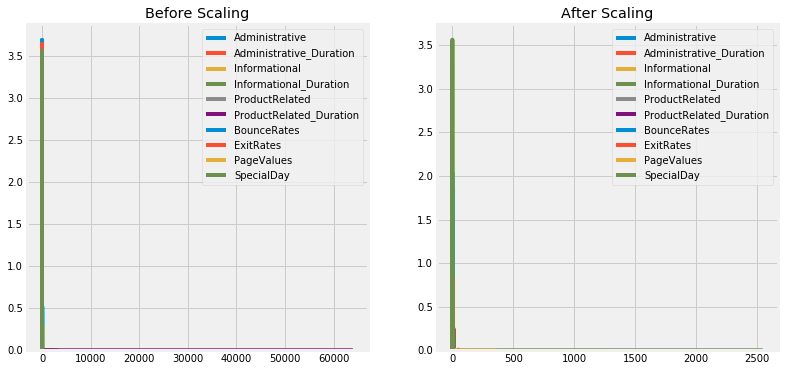

In [24]:
def viz_scaling(df_before, df_after):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 6))

    ax1.set_title('Before Scaling')
    for col in df_before[num_feats]:
        sns.kdeplot(df[col], ax=ax1, bw=0.1)

    ax2.set_title('After Scaling')
    for col in df_after[num_feats]:
        sns.kdeplot(df_after[col], ax=ax2, bw=0.1)
    
    plt.show()
    
viz_scaling(df, df_robust)    

### Split Train/Test 80/20

In [25]:
X_rob = df_robust.drop(columns='Revenue')
y_rob = df_robust['Revenue']

x_train_rob, x_test_rob, y_train_rob, y_test_rob = train_test_split(X_rob, y_rob, test_size = 0.20,
                                                    random_state = 88)

for data in [x_train_rob, x_test_rob, y_train_rob, y_test_rob]:
    print(data.shape)

(9864, 74)
(2466, 74)
(9864,)
(2466,)


### Spot Check Classification Algorithms

#### LogReg

Train score: 88.5%
Test score: 88.28%

              precision    recall  f1-score   support

           0       0.90      0.97      0.93      2073
           1       0.75      0.40      0.52       393

    accuracy                           0.88      2466
   macro avg       0.82      0.69      0.73      2466
weighted avg       0.87      0.88      0.87      2466



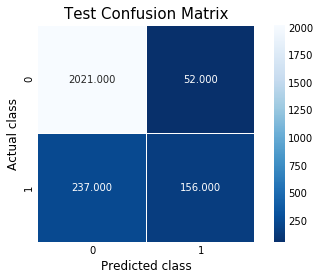

In [26]:
# LOGISTIC REGRESSION
classifier = LogisticRegression(solver='newton-cg',
                                penalty='l2',
                                max_iter=100
                               )
classifier.fit(x_train_rob, y_train_rob)
y_pred_rob = classifier.predict(x_test_rob)

# METRICS
print(f'Train score: {round(classifier.score(x_train_rob, y_train_rob)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test_rob, y_test_rob)*100, 2)}%\n')

print(classification_report(y_test_rob, y_pred_rob))

cm = confusion_matrix(y_test_rob, y_pred_rob)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

#### DT

Train score: 100.0%
Test score: 86.78%

              precision    recall  f1-score   support

           0       0.92      0.92      0.92      2073
           1       0.58      0.59      0.59       393

    accuracy                           0.87      2466
   macro avg       0.75      0.76      0.75      2466
weighted avg       0.87      0.87      0.87      2466



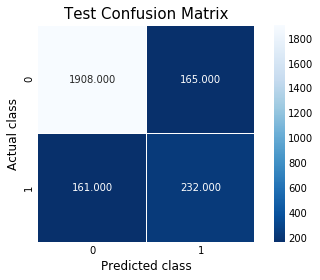

In [27]:
# DECISION TREE
classifier = DecisionTreeClassifier(criterion='gini', 
                                    max_depth=None, 
                                    min_samples_split=2,
                                    min_samples_leaf=1
                                   )
classifier.fit(x_train_rob, y_train_rob)
y_pred_rob = classifier.predict(x_test_rob)

# METRICS
print(f'Train score: {round(classifier.score(x_train_rob, y_train_rob)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test_rob, y_test_rob)*100, 2)}%\n')

print(classification_report(y_test_rob, y_pred_rob))

cm = confusion_matrix(y_test_rob, y_pred_rob)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

In [28]:
# VISUALIZE TREE
dot_data = StringIO()
export_graphviz(classifier, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = x_train_rob.columns, class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('DT Purchase.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.773883 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.773883 to fit



#### RF

Train score: 100.0%
Test score: 90.23%

              precision    recall  f1-score   support

           0       0.91      0.97      0.94      2073
           1       0.80      0.52      0.63       393

    accuracy                           0.90      2466
   macro avg       0.86      0.75      0.79      2466
weighted avg       0.90      0.90      0.89      2466



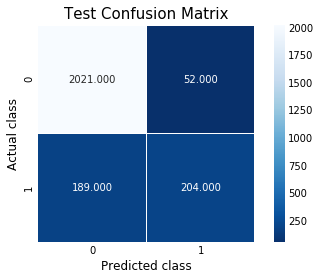

In [29]:
# RANDOM FOREST
classifier = RandomForestClassifier(criterion='gini', 
                                    max_depth=None, 
                                    min_samples_split=2, 
                                    min_samples_leaf=1, 
                                    n_estimators=100
                                   )
classifier.fit(x_train_rob, y_train_rob)
y_pred_rob = classifier.predict(x_test_rob)

# METRICS
print(f'Train score: {round(classifier.score(x_train_rob, y_train_rob)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test_rob, y_test_rob)*100, 2)}%\n')

print(classification_report(y_test_rob, y_pred_rob))

cm = confusion_matrix(y_test_rob, y_pred_rob)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

#### KNN

Train score: 91.32%
Test score: 88.73%

              precision    recall  f1-score   support

           0       0.92      0.95      0.93      2073
           1       0.68      0.55      0.61       393

    accuracy                           0.89      2466
   macro avg       0.80      0.75      0.77      2466
weighted avg       0.88      0.89      0.88      2466



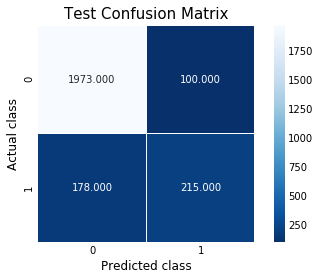

In [30]:
# K NEAREST NEIGHBORS
classifier = KNeighborsClassifier(n_neighbors=5,
                                  algorithm='auto'
                                 )
classifier.fit(x_train_rob, y_train_rob)
y_pred_rob = classifier.predict(x_test_rob)

# METRICS
print(f'Train score: {round(classifier.score(x_train_rob, y_train_rob)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test_rob, y_test_rob)*100, 2)}%\n')

print(classification_report(y_test_rob, y_pred_rob))

cm = confusion_matrix(y_test_rob, y_pred_rob)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

#### Naive Bayes

Train score: 83.64%
Test score: 84.43%

              precision    recall  f1-score   support

           0       0.93      0.88      0.90      2073
           1       0.51      0.66      0.58       393

    accuracy                           0.84      2466
   macro avg       0.72      0.77      0.74      2466
weighted avg       0.86      0.84      0.85      2466



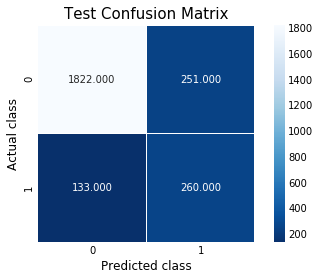

In [31]:
# NAIVE BAYES
classifier = BernoulliNB(alpha=1.0
                       )
classifier.fit(x_train_rob, y_train_rob)
y_pred_rob = classifier.predict(x_test_rob)

# METRICS
print(f'Train score: {round(classifier.score(x_train_rob, y_train_rob)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test_rob, y_test_rob)*100, 2)}%\n')

print(classification_report(y_test_rob, y_pred_rob))

cm = confusion_matrix(y_test_rob, y_pred_rob)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

#### SVM

Train score: 88.43%
Test score: 88.89%

              precision    recall  f1-score   support

           0       0.90      0.98      0.94      2073
           1       0.78      0.42      0.55       393

    accuracy                           0.89      2466
   macro avg       0.84      0.70      0.74      2466
weighted avg       0.88      0.89      0.87      2466



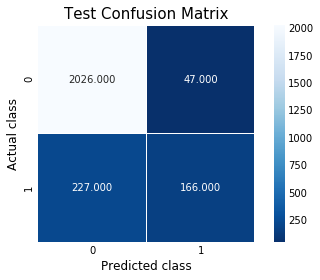

In [32]:
# SUPPORT VECTOR MACHINES
classifier = SVC(kernel='linear')
classifier.fit(x_train_rob, y_train_rob)
y_pred_rob = classifier.predict(x_test_rob)

# METRICS
print(f'Train score: {round(classifier.score(x_train_rob, y_train_rob)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test_rob, y_test_rob)*100, 2)}%\n')

print(classification_report(y_test_rob, y_pred_rob))

cm = confusion_matrix(y_test_rob, y_pred_rob)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

C:\Users\gabri\anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


Train score: 91.51%
Test score: 89.66%

              precision    recall  f1-score   support

           0       0.92      0.96      0.94      2073
           1       0.73      0.55      0.63       393

    accuracy                           0.90      2466
   macro avg       0.83      0.76      0.78      2466
weighted avg       0.89      0.90      0.89      2466



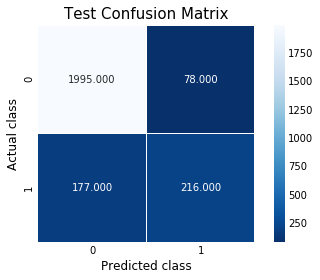

In [33]:
# SUPPORT VECTOR MACHINES
classifier = SVC(kernel='rbf')
classifier.fit(x_train_rob, y_train_rob)
y_pred_rob = classifier.predict(x_test_rob)

# METRICS
print(f'Train score: {round(classifier.score(x_train_rob, y_train_rob)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test_rob, y_test_rob)*100, 2)}%\n')

print(classification_report(y_test_rob, y_pred_rob))

cm = confusion_matrix(y_test_rob, y_pred_rob)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

#### MLP

Train score: 91.47%
Test score: 89.09%

              precision    recall  f1-score   support

           0       0.91      0.97      0.94      2073
           1       0.76      0.47      0.58       393

    accuracy                           0.89      2466
   macro avg       0.83      0.72      0.76      2466
weighted avg       0.88      0.89      0.88      2466



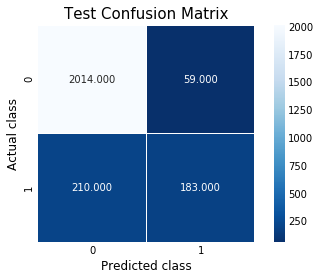

In [34]:
# MLP
classifier = MLPClassifier(hidden_layer_sizes=(100,),
                           activation='relu',
                           solver='adam', 
                           alpha=0.0001, 
                           random_state=1
                          )
classifier.fit(x_train_rob, y_train_rob)
y_pred_rob = classifier.predict(x_test_rob)

# METRICS
print(f'Train score: {round(classifier.score(x_train_rob, y_train_rob)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test_rob, y_test_rob)*100, 2)}%\n')

print(classification_report(y_test_rob, y_pred_rob))

cm = confusion_matrix(y_test_rob, y_pred_rob)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

Train score: 84.62%
Test score: 84.96%

              precision    recall  f1-score   support

           0       0.85      0.99      0.92      2073
           1       0.67      0.11      0.19       393

    accuracy                           0.85      2466
   macro avg       0.76      0.55      0.55      2466
weighted avg       0.82      0.85      0.80      2466



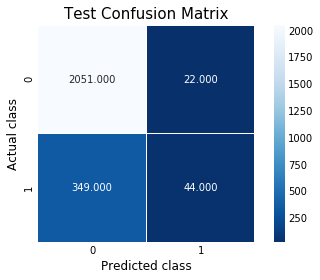

In [35]:
# MLP
classifier = MLPClassifier(hidden_layer_sizes=(100,),
                           activation='relu',
                           solver='lbfgs', 
                           alpha=0.0001, 
                           random_state=1
                          )
classifier.fit(x_train_rob, y_train_rob)
y_pred_rob = classifier.predict(x_test_rob)

# METRICS
print(f'Train score: {round(classifier.score(x_train_rob, y_train_rob)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test_rob, y_test_rob)*100, 2)}%\n')

print(classification_report(y_test_rob, y_pred_rob))

cm = confusion_matrix(y_test_rob, y_pred_rob)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

## StandardScaler

In [36]:
standard = StandardScaler()
df_standard = pd.DataFrame(standard.fit_transform(df[num_feats]), columns=num_feats)
df_standard = pd.concat([df_standard, df.drop(columns=num_feats)], axis=1)
df_standard.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,...,TrafficType_14,TrafficType_15,TrafficType_16,TrafficType_17,TrafficType_18,TrafficType_19,TrafficType_20,VisitorType_New_Visitor,VisitorType_Other,VisitorType_Returning_Visitor
count,1.233000e+04,1.233000e+04,1.233000e+04,1.233000e+04,1.233000e+04,1.233000e+04,1.233000e+04,1.233000e+04,1.233000e+04,1.233000e+04,...,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000
mean,-1.375191e-15,2.074316e-15,6.987391e-15,1.765777e-16,-2.849753e-16,1.021684e-15,1.333384e-15,-2.622846e-16,-4.953810e-15,-1.722823e-14,...,0.001054,0.003082,0.000243,0.000081,0.000811,0.001379,0.016058,0.137388,0.006894,0.855718
std,1.000041e+00,1.000041e+00,1.000041e+00,1.000041e+00,1.000041e+00,1.000041e+00,1.000041e+00,1.000041e+00,1.000041e+00,1.000041e+00,...,0.032455,0.055432,0.015597,0.009006,0.028468,0.037107,0.125705,0.344271,0.082745,0.351390
min,-6.969930e-01,-4.571914e-01,-3.964779e-01,-2.449305e-01,-7.134884e-01,-6.243475e-01,-4.576830e-01,-8.863706e-01,-3.171778e-01,-3.088214e-01,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-6.969930e-01,-4.571914e-01,-3.964779e-01,-2.449305e-01,-5.560920e-01,-5.281214e-01,-4.576830e-01,-5.923930e-01,-3.171778e-01,-3.088214e-01,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,-3.959377e-01,-4.147639e-01,-3.964779e-01,-2.449305e-01,-3.087548e-01,-3.113566e-01,-3.934903e-01,-3.686913e-01,-3.171778e-01,-3.088214e-01,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,5.072280e-01,7.035981e-02,-3.964779e-01,-2.449305e-01,1.409492e-01,1.407881e-01,-1.109348e-01,1.425510e-01,-3.171778e-01,-3.088214e-01,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,7.431499e+00,1.876956e+01,1.849960e+01,1.786868e+01,1.513858e+01,3.280678e+01,3.667189e+00,3.229316e+00,1.916634e+01,4.718598e+00,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


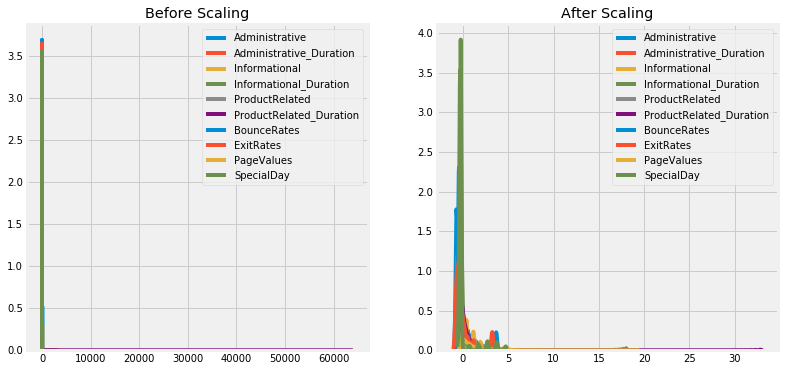

In [37]:
viz_scaling(df, df_standard)    

### Split Train/Test 80/20

In [38]:
X_std = df_standard.drop(columns='Revenue')
y_std = df_standard['Revenue']

x_train_std, x_test_std, y_train_std, y_test_std = train_test_split(X_std, y_std, test_size = 0.20,
                                                    random_state = 88)

for data in [x_train_std, x_test_std, y_train_std, y_test_std]:
    print(data.shape)

(9864, 74)
(2466, 74)
(9864,)
(2466,)


### Spot Check Classification Algorithms

#### LogReg

Train score: 88.49%
Test score: 88.28%

              precision    recall  f1-score   support

           0       0.89      0.98      0.93      2073
           1       0.75      0.39      0.52       393

    accuracy                           0.88      2466
   macro avg       0.82      0.68      0.73      2466
weighted avg       0.87      0.88      0.87      2466



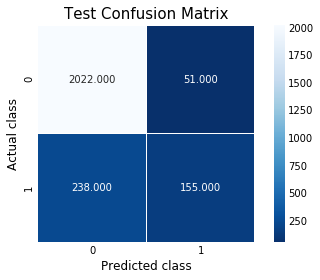

In [39]:
# LOGISTIC REGRESSION
classifier = LogisticRegression(solver='newton-cg',
                                penalty='l2',
                                max_iter=100
                               )
classifier.fit(x_train_std, y_train_std)
y_pred_std = classifier.predict(x_test_std)

# METRICS
print(f'Train score: {round(classifier.score(x_train_std, y_train_std)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test_std, y_test_std)*100, 2)}%\n')

print(classification_report(y_test_std, y_pred_std))

cm = confusion_matrix(y_test_std, y_pred_std)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

#### DT

Train score: 100.0%
Test score: 86.9%

              precision    recall  f1-score   support

           0       0.92      0.92      0.92      2073
           1       0.59      0.59      0.59       393

    accuracy                           0.87      2466
   macro avg       0.76      0.75      0.75      2466
weighted avg       0.87      0.87      0.87      2466



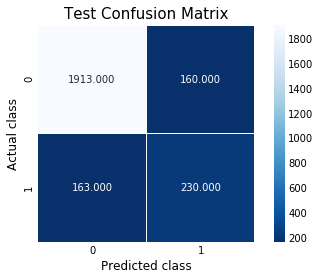

In [40]:
# DECISION TREE
classifier = DecisionTreeClassifier(criterion='gini', 
                                    max_depth=None, 
                                    min_samples_split=2,
                                    min_samples_leaf=1
                                   )
classifier.fit(x_train_std, y_train_std)
y_pred_std = classifier.predict(x_test_std)

# METRICS
print(f'Train score: {round(classifier.score(x_train_std, y_train_std)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test_std, y_test_std)*100, 2)}%\n')

print(classification_report(y_test_std, y_pred_std))

cm = confusion_matrix(y_test_std, y_pred_std)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

In [41]:
# VISUALIZE TREE
dot_data = StringIO()
export_graphviz(classifier, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = x_train_std.columns, class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('DT Purchase.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.767431 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.767431 to fit



#### RF

Train score: 100.0%
Test score: 90.35%

              precision    recall  f1-score   support

           0       0.92      0.97      0.94      2073
           1       0.79      0.53      0.64       393

    accuracy                           0.90      2466
   macro avg       0.85      0.75      0.79      2466
weighted avg       0.90      0.90      0.90      2466



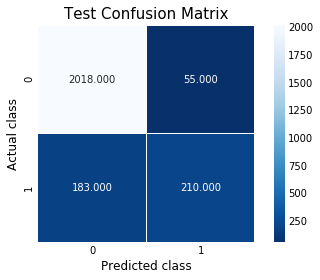

In [42]:
# RANDOM FOREST
classifier = RandomForestClassifier(criterion='gini', 
                                    max_depth=None, 
                                    min_samples_split=2, 
                                    min_samples_leaf=1, 
                                    n_estimators=100
                                   )
classifier.fit(x_train_std, y_train_std)
y_pred_std = classifier.predict(x_test_std)

# METRICS
print(f'Train score: {round(classifier.score(x_train_std, y_train_std)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test_std, y_test_std)*100, 2)}%\n')

print(classification_report(y_test_std, y_pred_std))

cm = confusion_matrix(y_test_std, y_pred_std)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

#### KNN

Train score: 90.17%
Test score: 87.88%

              precision    recall  f1-score   support

           0       0.90      0.97      0.93      2073
           1       0.71      0.40      0.52       393

    accuracy                           0.88      2466
   macro avg       0.80      0.69      0.72      2466
weighted avg       0.87      0.88      0.86      2466



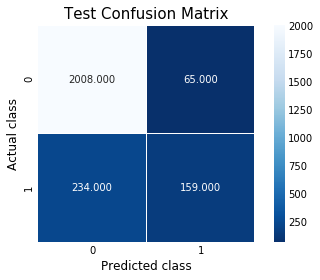

In [43]:
# K NEAREST NEIGHBORS
classifier = KNeighborsClassifier(n_neighbors=5,
                                  algorithm='auto'
                                 )
classifier.fit(x_train_std, y_train_std)
y_pred_std = classifier.predict(x_test_std)

# METRICS
print(f'Train score: {round(classifier.score(x_train_std, y_train_std)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test_std, y_test_std)*100, 2)}%\n')

print(classification_report(y_test_std, y_pred_std))

cm = confusion_matrix(y_test_std, y_pred_std)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

#### Naive Bayes

Train score: 83.84%
Test score: 85.36%

              precision    recall  f1-score   support

           0       0.93      0.89      0.91      2073
           1       0.53      0.66      0.59       393

    accuracy                           0.85      2466
   macro avg       0.73      0.77      0.75      2466
weighted avg       0.87      0.85      0.86      2466



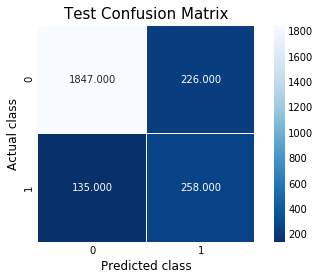

In [44]:
# NAIVE BAYES
classifier = BernoulliNB(alpha=1.0
                       )
classifier.fit(x_train_std, y_train_std)
y_pred_std = classifier.predict(x_test_std)

# METRICS
print(f'Train score: {round(classifier.score(x_train_std, y_train_std)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test_std, y_test_std)*100, 2)}%\n')

print(classification_report(y_test_std, y_pred_std))

cm = confusion_matrix(y_test_std, y_pred_std)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

#### SVM

Train score: 88.38%
Test score: 88.85%

              precision    recall  f1-score   support

           0       0.90      0.98      0.94      2073
           1       0.78      0.42      0.55       393

    accuracy                           0.89      2466
   macro avg       0.84      0.70      0.74      2466
weighted avg       0.88      0.89      0.87      2466



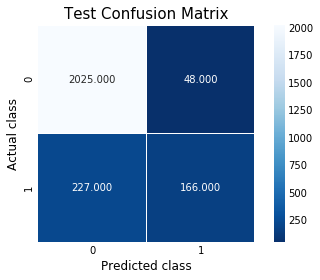

In [45]:
# SUPPORT VECTOR MACHINES
classifier = SVC(kernel='linear')
classifier.fit(x_train_std, y_train_std)
y_pred_std = classifier.predict(x_test_std)

# METRICS
print(f'Train score: {round(classifier.score(x_train_std, y_train_std)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test_std, y_test_std)*100, 2)}%\n')

print(classification_report(y_test_std, y_pred_std))

cm = confusion_matrix(y_test_std, y_pred_std)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

C:\Users\gabri\anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


Train score: 89.15%
Test score: 89.62%

              precision    recall  f1-score   support

           0       0.91      0.98      0.94      2073
           1       0.79      0.48      0.59       393

    accuracy                           0.90      2466
   macro avg       0.85      0.73      0.77      2466
weighted avg       0.89      0.90      0.89      2466



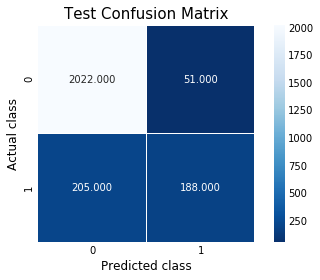

In [46]:
# SUPPORT VECTOR MACHINES
classifier = SVC(kernel='rbf')
classifier.fit(x_train_std, y_train_std)
y_pred_std = classifier.predict(x_test_std)

# METRICS
print(f'Train score: {round(classifier.score(x_train_std, y_train_std)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test_std, y_test_std)*100, 2)}%\n')

print(classification_report(y_test_std, y_pred_std))

cm = confusion_matrix(y_test_std, y_pred_std)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

#### MLP

Train score: 99.57%
Test score: 87.47%

              precision    recall  f1-score   support

           0       0.92      0.93      0.93      2073
           1       0.61      0.58      0.60       393

    accuracy                           0.87      2466
   macro avg       0.77      0.76      0.76      2466
weighted avg       0.87      0.87      0.87      2466



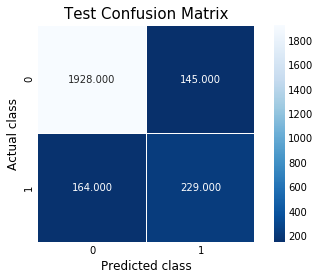

In [47]:
# MLP
classifier = MLPClassifier(hidden_layer_sizes=(100,),
                           activation='relu',
                           solver='adam', 
                           alpha=0.0001, 
                           random_state=1,
                           max_iter=1000  # MODIFIED FROM 200, FAILED TO CONVERGE
                          )
classifier.fit(x_train_std, y_train_std)
y_pred_std = classifier.predict(x_test_std)

# METRICS
print(f'Train score: {round(classifier.score(x_train_std, y_train_std)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test_std, y_test_std)*100, 2)}%\n')

print(classification_report(y_test_std, y_pred_std))

cm = confusion_matrix(y_test_std, y_pred_std)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

Train score: 99.68%
Test score: 87.06%

              precision    recall  f1-score   support

           0       0.92      0.93      0.92      2073
           1       0.60      0.57      0.58       393

    accuracy                           0.87      2466
   macro avg       0.76      0.75      0.75      2466
weighted avg       0.87      0.87      0.87      2466



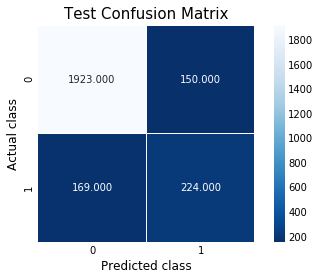

In [48]:
# MLP
classifier = MLPClassifier(hidden_layer_sizes=(100,),
                           activation='relu',
                           solver='lbfgs', 
                           alpha=0.0001, 
                           random_state=1
                          )
classifier.fit(x_train_std, y_train_std)
y_pred_std = classifier.predict(x_test_std)

# METRICS
print(f'Train score: {round(classifier.score(x_train_std, y_train_std)*100, 2)}%')
print(f'Test score: {round(classifier.score(x_test_std, y_test_std)*100, 2)}%\n')

print(classification_report(y_test_std, y_pred_std))

cm = confusion_matrix(y_test_std, y_pred_std)

sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.xlabel('Predicted class')
plt.ylabel('Actual class')
plt.title('Test Confusion Matrix', size = 15)
plt.show()

## Best Scalers for Models

## Pick Promising Models

## SMOTE Oversampling

## Feature Selection

## Eliminate Multicollinearity

## Hyperparameter Tuning